In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px

# Import the data

Now, the phone data:

In [2]:
acc = pd.read_csv('./../../Data_phone/pali-otthon/Accelerometer.csv',sep=',',header=0,names=['time','seconds_elapsed','acc_z','acc_y','acc_x'])
gyr = pd.read_csv('./../../Data_phone/pali-otthon/Gyroscope.csv',sep=',',header=0,names=['time','seconds_elapsed','gyr_z','gyr_y','gyr_x'])
#mag = pd.read_csv('./../../Data_phone/pali-otthon/Magnetometer.csv',sep=',',header=0,names=['time','seconds_elapsed','mag_z','mag_y','mag_x'])
loc = pd.read_csv('./../../Data_phone/pali-otthon/Location.csv',sep=',')

df = pd.concat([acc, gyr[['gyr_z','gyr_y','gyr_x']]], axis=1) #Concat the vibration data """, mag[['mag_z','mag_y','mag_x']]"""

# Cleaning

### Interpolate the GPS data

In [3]:
loc_new = pd.DataFrame()
fp = loc['seconds_elapsed'] #interpolaciohoz: ismert adatpontok helye
x = df['seconds_elapsed'] #interpolaciohoz: uj adatpontok helye

for j in ['latitude','longitude','speed']:
    xp = loc[j] #interpolaciohoz: eredeti y ertekek
    loc_new[j] = np.interp(x, fp, xp) 
    
df = pd.concat([df, loc_new], axis=1)
df.rename(columns={"latitude":"lat", "longitude": "lon"}, inplace=True)

df.head()

,time,seconds_elapsed,acc_z,acc_y,acc_x,gyr_z,gyr_y,gyr_x,lat,lon,speed
0,1709479874816941300,0.030941,0.003924,-0.323628,-0.246644,-0.013459,0.080146,-0.007117,46.899863,16.857550,18.467588
1,1709479874826998300,0.040998,-0.285720,0.284784,-0.068226,-0.023030,0.055037,0.004746,46.899862,16.857549,18.467573
2,1709479874837056500,0.051056,0.692226,-0.024066,-0.644851,-0.013440,0.075295,-0.001381,46.899860,16.857549,18.467558
3,1709479874847114200,0.061114,-0.363028,-0.022247,-0.183344,-0.014847,0.065443,0.003200,46.899858,16.857548,18.467544
4,1709479874857171200,0.071171,0.338663,0.214720,0.074267,-0.026248,0.010992,0.013625,46.899856,16.857548,18.467529


### Trajectory smoothing

In [4]:
def moving_average(x, N=100):
    padded = np.pad(x, (N//2, N-1-N//2), mode='edge')
    return np.convolve(padded, np.ones((N,))/N, mode='valid')

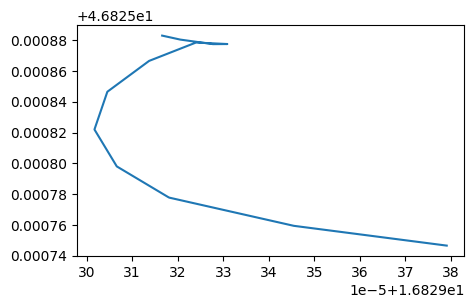

In [5]:
plt.figure(figsize=(5,3))
plt.plot(df['lon'].to_numpy()[77000:], df['lat'].to_numpy()[77000:])

In [6]:
df['lon'] = moving_average(df['lon'].copy().to_numpy())
df['lat'] = moving_average(df['lat'].copy().to_numpy())

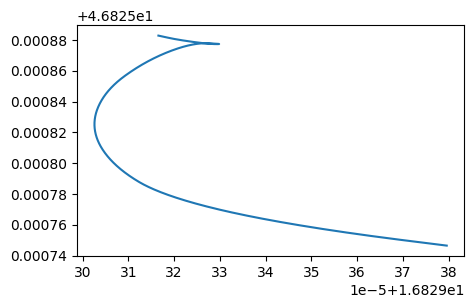

In [7]:
plt.figure(figsize=(5,3))
plt.plot(df['lon'][77000:], df['lat'][77000:])

### Spatial resampling

In [8]:
dDist = []
for j in np.arange(2,len(df)):
    d = abs(np.arccos(np.cos(np.deg2rad(90-df['lat'].loc[j-1])) * np.cos(np.deg2rad(90-df['lat'].loc[j])) + np.sin(np.deg2rad(90-df['lat'].loc[j-1])) * np.sin(np.deg2rad(90-df['lat'].loc[j]))) * np.cos(np.deg2rad(df['lon'].loc[j-1]-df['lon'].loc[j])) * 3958.76);
    dDist.append(d)
df_dDist = pd.DataFrame(dDist)
df_dDist.fillna(0,inplace=True) #remove the NaN values, introduced from the above calculation
df_dDist.isna().value_counts()

df_dDist[0].replace(0, 0.000001, inplace=True) #correct the count error

/var/folders/w_/802pn39d4f75d8__y1zs9yxm0000gn/T/ipykernel_67431/3827963625.py:3: RuntimeWarning: invalid value encountered in arccos
  d = abs(np.arccos(np.cos(np.deg2rad(90-df['lat'].loc[j-1])) * np.cos(np.deg2rad(90-df['lat'].loc[j])) + np.sin(np.deg2rad(90-df['lat'].loc[j-1])) * np.sin(np.deg2rad(90-df['lat'].loc[j]))) * np.cos(np.deg2rad(df['lon'].loc[j-1]-df['lon'].loc[j])) * 3958.76);
/var/folders/w_/802pn39d4f75d8__y1zs9yxm0000gn/T/ipykernel_67431/3827963625.py:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_dDist[

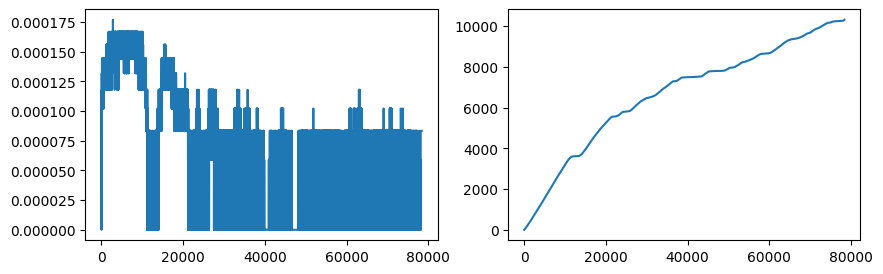

In [9]:
plt.figure(figsize=(10,3))
plt.subplot(121)
plt.plot(dDist)
plt.subplot(122)
plt.plot(np.cumsum(df_dDist.to_numpy())*2200)

In [10]:
fs = 5

summed = np.cumsum(df_dDist.to_numpy())*2200   #calculated the total travelled distance by cumsum function
uniqe_indexes = np.unique(summed,return_index=True)
x = np.arange(0,max(summed),1/fs)

# Then we use again the interp function to convert the time domain to the spatial domain
df_spatial = pd.DataFrame()
for j in ['acc_z','acc_y','acc_x','gyr_z','gyr_y','gyr_x','lat','lon','speed','time','seconds_elapsed']:
    xp = df[j]
    df_spatial[j] = np.interp(x,uniqe_indexes[0],xp[uniqe_indexes[1]])


In [11]:
from scipy.interpolate import CubicSpline

In [12]:
df_spatial_spline = pd.DataFrame()
for j in ['acc_z','acc_y','acc_x','gyr_z','gyr_y','gyr_x','lat','lon','speed','time','seconds_elapsed']:
    xp = df[j][:-2]
    cs = CubicSpline(summed,xp)
    df_spatial_spline[j] = cs(x)

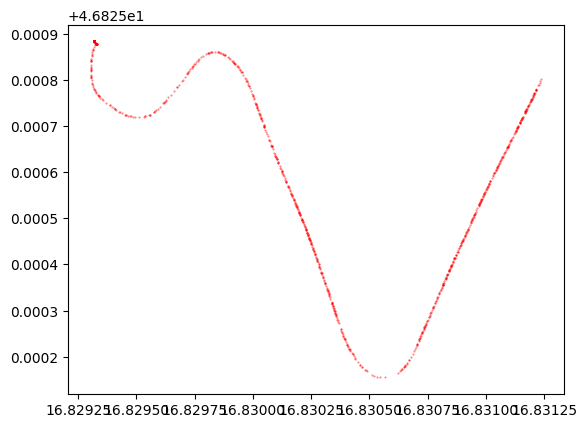

In [13]:
plt.plot(df_spatial_spline['lon'][50500:],df_spatial_spline['lat'][50500:], 'r.', markersize=1, alpha=0.5)

<Axes: xlabel='lon', ylabel='lat'>

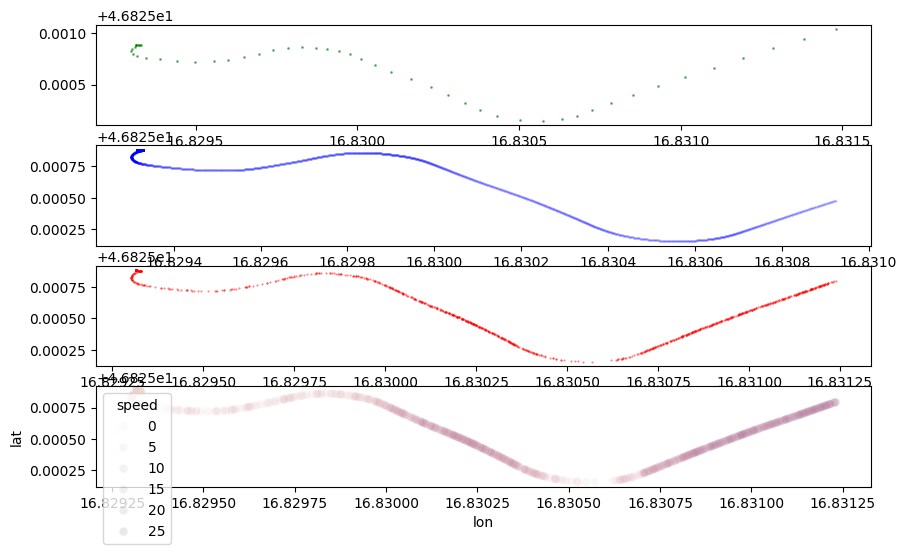

In [14]:
# Check the results
plt.figure(figsize=(10,6))
plt.subplot(411)
plt.plot(loc['longitude'][740:],loc['latitude'][740:], 'g.', markersize=2, alpha=0.5)
plt.subplot(412)
plt.plot(df['lon'][74000:],df['lat'][74000:], 'b.', markersize=2, alpha=0.05)
plt.subplot(413)
plt.plot(df_spatial_spline['lon'][50500:],df_spatial_spline['lat'][50500:], 'r.', markersize=1, alpha=0.5)
plt.subplot(414)
sns.scatterplot(x=df_spatial['lon'][50500:],y=df_spatial['lat'][50500:], hue=df_spatial['speed'],alpha=0.1)

<Figure size 400x400 with 0 Axes>

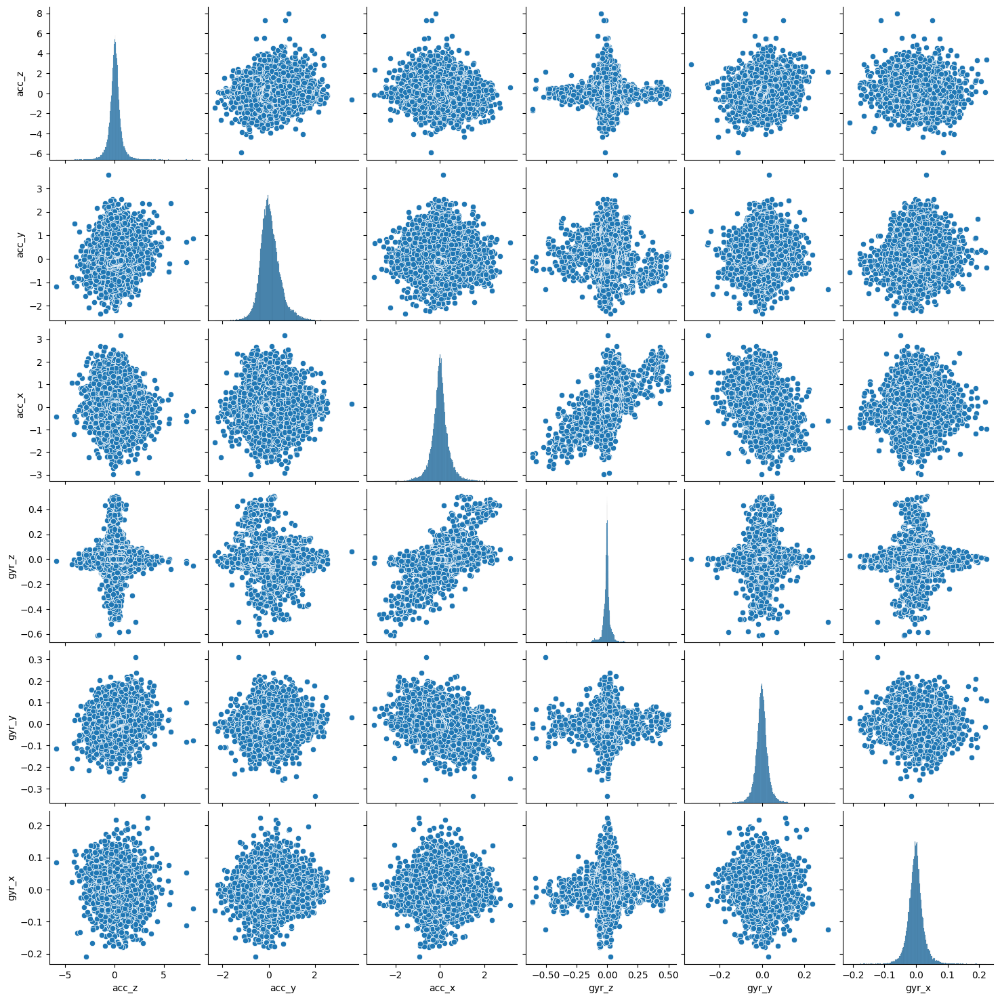

In [15]:
plt.figure(figsize=(4,4))
sns.pairplot(data=df_spatial[['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x']])

### Normalization

In [16]:
from sklearn.preprocessing import normalize

In [17]:
df_normalized = pd.DataFrame(normalize(df_spatial[['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x']], norm='max', axis=0))
df_normalized.columns = ['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x']

df_normalized['lat'] = df_spatial['lat']
df_normalized['lon'] = df_spatial['lon']
df_normalized['speed'] = df_spatial['speed']
df_normalized['time'] = df_spatial['time']
df_normalized['seconds_elapsed'] = df_spatial['seconds_elapsed']

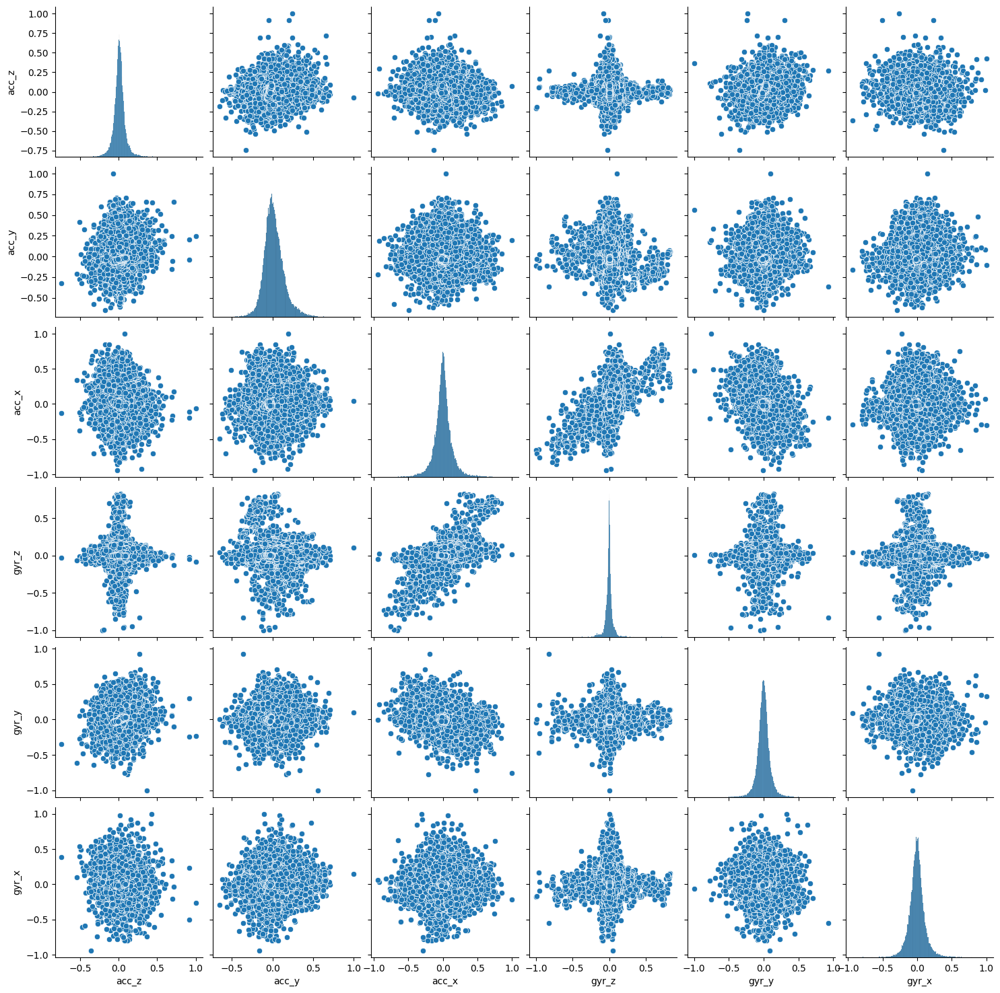

In [23]:
sns.pairplot(data=df_normalized[['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x']])

# Feature extraction

In [18]:
df_spatial.describe()

,acc_z,acc_y,acc_x,gyr_z,gyr_y,gyr_x,lat,lon,speed,time,seconds_elapsed
count,51576.000000,51576.000000,51576.000000,51576.000000,51576.000000,51576.000000,51576.000000,51576.000000,51576.000000,5.157600e+04,51576.000000
mean,0.072669,0.066874,0.006531,-0.002707,-0.000654,-0.001125,46.863987,16.848779,16.690873,1.709480e+18,278.611109
std,0.605351,0.447443,0.413690,0.042370,0.030680,0.025371,0.021684,0.007114,6.081154,2.303782e+11,230.378226
min,-5.909624,-2.324377,-2.981962,-0.609738,-0.334334,-0.209880,46.825155,16.829303,0.000000,1.709480e+18,0.030941
25%,-0.225516,-0.213366,-0.191050,-0.013389,-0.016578,-0.014666,46.846081,16.843661,11.689959,1.709480e+18,81.227278
50%,0.066423,0.022404,0.003535,-0.001478,-0.000779,-0.001255,46.865339,16.853099,16.100736,1.709480e+18,196.711583
75%,0.352594,0.303211,0.196450,0.008356,0.014831,0.011684,46.882735,16.853597,22.961514,1.709480e+18,450.838424
max,7.971501,3.585666,3.169476,0.505261,0.310204,0.223573,46.899842,16.857543,25.752999,1.709481e+18,788.281128


In [19]:
df_normalized.describe()

,acc_z,acc_y,acc_x,gyr_z,gyr_y,gyr_x,lat,lon,speed,time,seconds_elapsed
count,51576.000000,51576.000000,51576.000000,51576.000000,51576.000000,51576.000000,51576.000000,51576.000000,51576.000000,5.157600e+04,51576.000000
mean,0.009116,0.018650,0.002061,-0.004440,-0.001956,-0.005030,46.863987,16.848779,16.690873,1.709480e+18,278.611109
std,0.075939,0.124787,0.130523,0.069488,0.091765,0.113480,0.021684,0.007114,6.081154,2.303782e+11,230.378226
min,-0.741344,-0.648241,-0.940837,-1.000000,-1.000000,-0.938754,46.825155,16.829303,0.000000,1.709480e+18,0.030941
25%,-0.028290,-0.059505,-0.060278,-0.021959,-0.049584,-0.065597,46.846081,16.843661,11.689959,1.709480e+18,81.227278
50%,0.008333,0.006248,0.001115,-0.002424,-0.002330,-0.005615,46.865339,16.853099,16.100736,1.709480e+18,196.711583
75%,0.044232,0.084562,0.061982,0.013705,0.044359,0.052261,46.882735,16.853597,22.961514,1.709480e+18,450.838424
max,1.000000,1.000000,1.000000,0.828653,0.927826,1.000000,46.899842,16.857543,25.752999,1.709481e+18,788.281128


<Axes: >

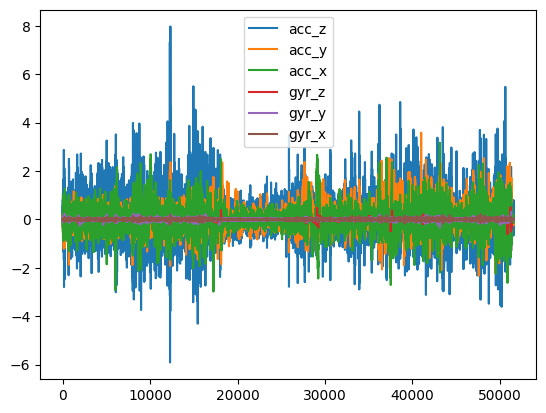

In [20]:
df_spatial[['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x']].plot()

<Axes: >

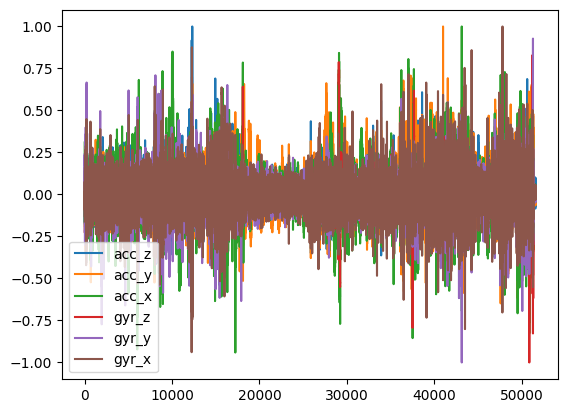

In [21]:
df_normalized[['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x']].plot()

### Spectrogram

In [22]:
from scipy import signal

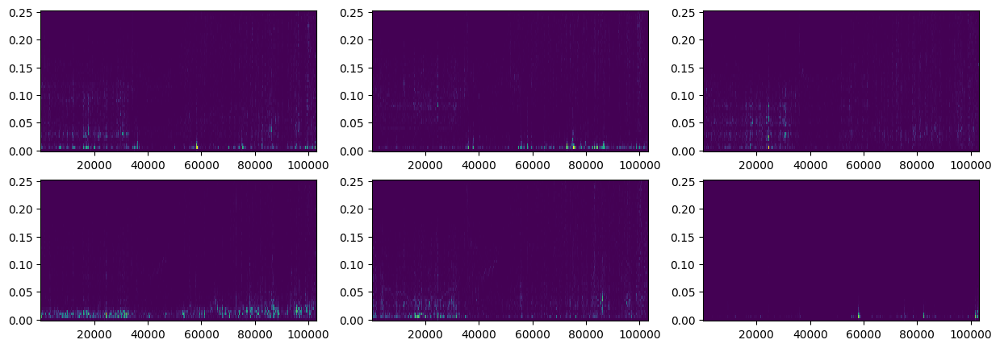

In [23]:
fs = 0.5

plt.figure(figsize=(15,5))
plt.subplot(231)
f, t, Sxx = signal.spectrogram(df_normalized['acc_x'], fs, nperseg=100, noverlap=30)
plt.pcolormesh(t, f, Sxx, shading='nearest', rasterized=True, alpha=1, norm='symlog')
plt.subplot(232)
f, t, Sxx = signal.spectrogram(df_normalized['acc_y'], fs, nperseg=100, noverlap=30)
plt.pcolormesh(t, f, Sxx, shading='nearest', rasterized=True, alpha=1, norm='symlog')
plt.subplot(233)
f, t, Sxx = signal.spectrogram(df_normalized['acc_z'], fs, nperseg=100, noverlap=30)
plt.pcolormesh(t, f, Sxx, shading='nearest', rasterized=True, alpha=1, norm='symlog')

plt.subplot(234)
f, t, Sxx = signal.spectrogram(df_normalized['gyr_x'], fs, nperseg=100, noverlap=30)
plt.pcolormesh(t, f, Sxx, shading='nearest', rasterized=True, alpha=1, norm='symlog')
plt.subplot(235)
f, t, Sxx = signal.spectrogram(df_normalized['gyr_y'], fs, nperseg=100, noverlap=30)
plt.pcolormesh(t, f, Sxx, shading='nearest', rasterized=True, alpha=1, norm='symlog')
plt.subplot(236)
f, t, Sxx = signal.spectrogram(df_normalized['gyr_z'], fs, nperseg=100, noverlap=30)
plt.pcolormesh(t, f, Sxx, shading='nearest', rasterized=True, alpha=1, norm='symlog')

In [24]:
import matplotlib.scale as scl
scl.get_scale_names()

['asinh', 'function', 'functionlog', 'linear', 'log', 'logit', 'symlog']

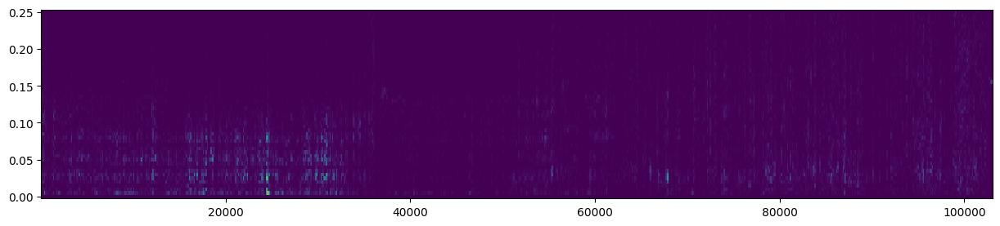

In [25]:
f, t, Sxx = signal.spectrogram(df_normalized['acc_z'], fs, nperseg=100, noverlap=30)
plt.figure(figsize=(15,3))
plt.pcolormesh(t, f, Sxx, shading='nearest', rasterized=True, alpha=1, norm='asinh')

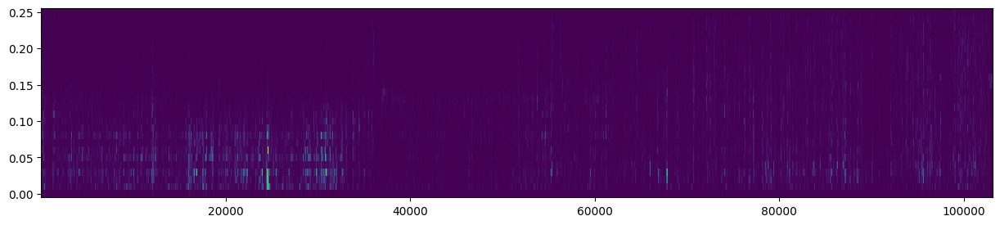

In [26]:
f, t, Sxx = signal.spectrogram(df_normalized['acc_z'], fs, nperseg=50, noverlap=30)
plt.figure(figsize=(15,3))
plt.pcolormesh(t, f, Sxx, shading='nearest', rasterized=True, alpha=1, norm='asinh')

In [27]:
Sxx.shape

(26, 2577)

'norm=\'symlog\' --> A quasi-logarithmic scale based on the inverse hyperbolic sine (asinh)\n\n    For values close to zero, this is essentially a linear scale,\n    but for large magnitude values (either positive or negative)\n    it is asymptotically logarithmic. The transition between these\n    linear and logarithmic regimes is smooth, and has no discontinuities\n    in the function gradient in contrast to\n    the `.SymmetricalLogScale` ("symlog") scale.'

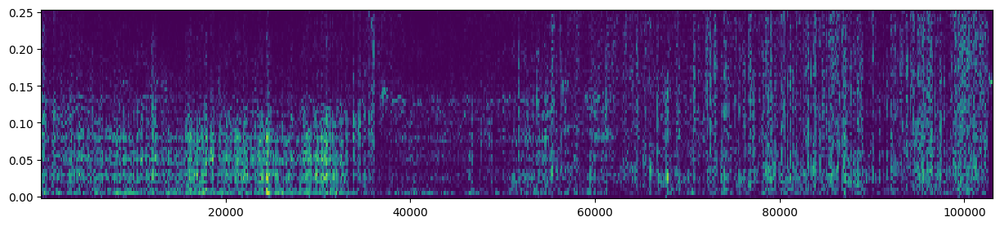

In [28]:
f, t, Sxx = signal.spectrogram(df_spatial['acc_z'], fs, nperseg=100, noverlap=30)
plt.figure(figsize=(15,3))
plt.pcolormesh(t, f, Sxx, shading='nearest', rasterized=True, alpha=1, norm='symlog')


"""norm='symlog' --> A quasi-logarithmic scale based on the inverse hyperbolic sine (asinh)

    For values close to zero, this is essentially a linear scale,
    but for large magnitude values (either positive or negative)
    it is asymptotically logarithmic. The transition between these
    linear and logarithmic regimes is smooth, and has no discontinuities
    in the function gradient in contrast to
    the `.SymmetricalLogScale` ("symlog") scale."""

### Sum the Y axis

In [29]:
df_sum_spectrum = pd.DataFrame()
for var in ['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z']:
    f, t, Sxx = signal.spectrogram(df_normalized[var], 5, nperseg=50, noverlap=30) # here I use 5 Hz for fs    ### or nperseg=100 ???
    new_row = np.sum(Sxx, axis=0)
    df_sum_spectrum = pd.concat([df_sum_spectrum, pd.DataFrame([new_row]).T], ignore_index=True, axis=1)

df_sum_spectrum.columns = ['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z']

In [30]:
df_sum_spectrum

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z
0,0.092817,0.041295,0.037039,0.062556,0.168981,0.000948
1,0.142495,0.039715,0.071338,0.068183,0.125444,0.002080
2,0.091306,0.042550,0.087419,0.039939,0.111203,0.001499
3,0.088197,0.043697,0.094993,0.084212,0.144118,0.000943
4,0.148661,0.061805,0.125346,0.126382,0.179541,0.001227
...,...,...,...,...,...,...
2572,0.005696,0.001989,0.023025,0.002322,0.005204,0.000081
2573,0.006393,0.001949,0.025849,0.002568,0.005734,0.000072
2574,0.007054,0.001860,0.025985,0.002444,0.005760,0.000075
2575,0.008582,0.001776,0.026898,0.002359,0.006438,0.000099


<Axes: >

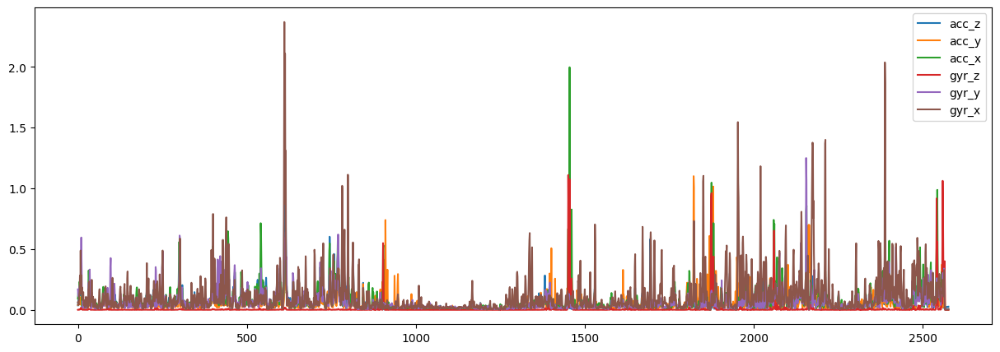

In [31]:
fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot(111)
df_sum_spectrum[['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x']].plot(ax=ax)

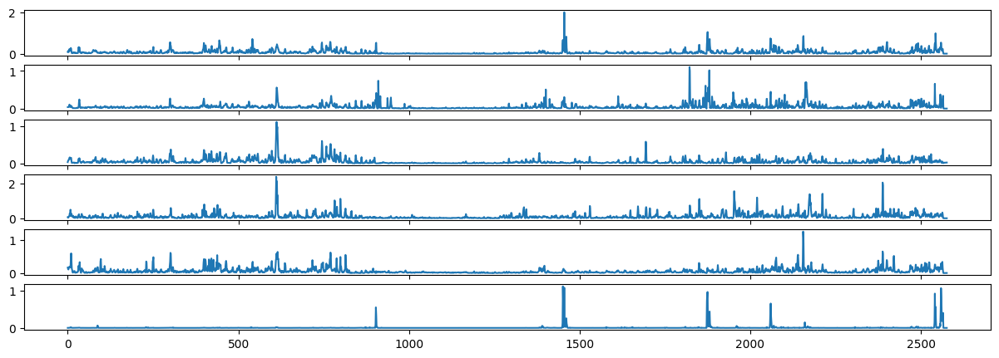

In [32]:
fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot(611)
plt.plot(df_sum_spectrum['acc_x'])
ax = fig.add_subplot(612)
plt.plot(df_sum_spectrum['acc_y'])
ax = fig.add_subplot(613)
plt.plot(df_sum_spectrum['acc_z'])
ax = fig.add_subplot(614)
plt.plot(df_sum_spectrum['gyr_x'])
ax = fig.add_subplot(615)
plt.plot(df_sum_spectrum['gyr_y'])
ax = fig.add_subplot(616)
plt.plot(df_sum_spectrum['gyr_z'])

In [33]:
# Interpolate the GPS data to fit for the spectrum data size

for j in ['lat','lon']:
    xp = df[j][:-2]
    cs = CubicSpline(summed,xp)
    df_sum_spectrum[j] = cs(t)

In [34]:
df_sum_spectrum

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,lat,lon
0,0.092817,0.041295,0.037039,0.062556,0.168981,0.000948,46.899810,16.857534
1,0.142495,0.039715,0.071338,0.068183,0.125444,0.002080,46.899785,16.857527
2,0.091306,0.042550,0.087419,0.039939,0.111203,0.001499,46.899758,16.857519
3,0.088197,0.043697,0.094993,0.084212,0.144118,0.000943,46.899730,16.857511
4,0.148661,0.061805,0.125346,0.126382,0.179541,0.001227,46.899703,16.857503
...,...,...,...,...,...,...,...,...
2572,0.005696,0.001989,0.023025,0.002322,0.005204,0.000081,46.825883,16.829317
2573,0.006393,0.001949,0.025849,0.002568,0.005734,0.000072,46.825883,16.829317
2574,0.007054,0.001860,0.025985,0.002444,0.005760,0.000075,46.825883,16.829317
2575,0.008582,0.001776,0.026898,0.002359,0.006438,0.000099,46.825883,16.829317


In [35]:
df_sum_spectrum['acc_z'].describe()

count    2577.000000
mean        0.054378
std         0.073751
min         0.002053
25%         0.015053
50%         0.030470
75%         0.064452
max         1.112158
Name: acc_z, dtype: float64

In [36]:
df_sum_spectrum[df_sum_spectrum['acc_z'] < 1]

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,lat,lon
0,0.092817,0.041295,0.037039,0.062556,0.168981,0.000948,46.899810,16.857534
1,0.142495,0.039715,0.071338,0.068183,0.125444,0.002080,46.899785,16.857527
2,0.091306,0.042550,0.087419,0.039939,0.111203,0.001499,46.899758,16.857519
3,0.088197,0.043697,0.094993,0.084212,0.144118,0.000943,46.899730,16.857511
4,0.148661,0.061805,0.125346,0.126382,0.179541,0.001227,46.899703,16.857503
...,...,...,...,...,...,...,...,...
2572,0.005696,0.001989,0.023025,0.002322,0.005204,0.000081,46.825883,16.829317
2573,0.006393,0.001949,0.025849,0.002568,0.005734,0.000072,46.825883,16.829317
2574,0.007054,0.001860,0.025985,0.002444,0.005760,0.000075,46.825883,16.829317
2575,0.008582,0.001776,0.026898,0.002359,0.006438,0.000099,46.825883,16.829317


<Axes: ylabel='Frequency'>

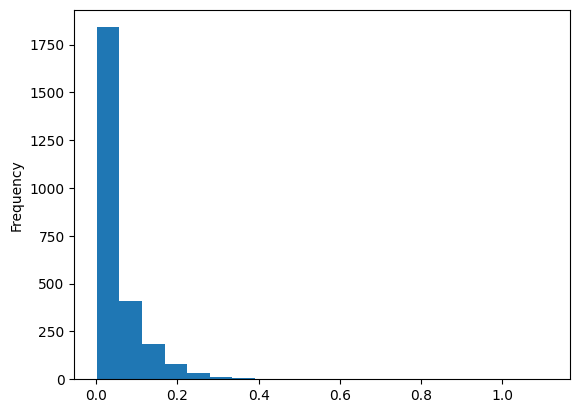

In [37]:
df_sum_spectrum['acc_z'].plot(kind='hist', bins=20)

In [154]:
fig = px.scatter_mapbox(lat=df_sum_spectrum[df_sum_spectrum['acc_z'] < 0.2]['lat'], lon=df_sum_spectrum[df_sum_spectrum['acc_z'] < 0.2]['lon'], color= df_sum_spectrum[df_sum_spectrum['acc_z'] < 0.2]['acc_x'], zoom=10, width=500, height=500 , color_continuous_scale=px.colors.diverging.RdYlGn_r)
#fig.update_geos(scope='europe')
fig.update_geos(fitbounds="locations")
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    mapbox=dict(
    style="light", 
    accesstoken='pk.eyJ1Ijoicm9sYW5kbmFneSIsImEiOiJjbHRrZXptcWMweTJtMmlzNG40YjNmY3ozIn0.66tCRA-MiLLA-xAKcPiPlw',
    pitch=0,
    zoom=5
    )
)

fig.show()

<Axes: >

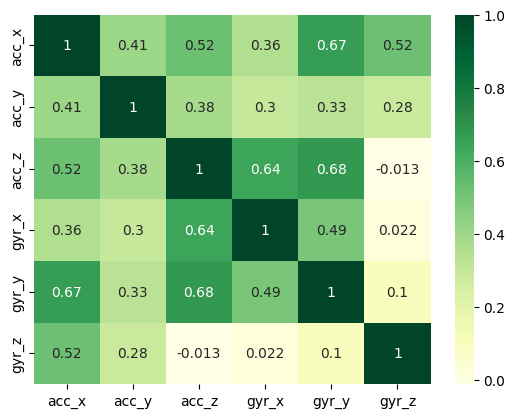

In [155]:
sns.heatmap(df_sum_spectrum[['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z']].corr(), annot=True, cmap='YlGn')

### Aggressive maneuver detection

In [38]:
from scipy.signal import find_peaks

In [39]:
# Aggressive maneuver are represented by the acc_x and the gyr_z variables
    # See the above correlation map
    # And the sensor orientation
    
df_sum_spectrum[['acc_x','gyr_z']].describe()

,acc_x,gyr_z
count,2577.000000,2577.000000
mean,0.076969,0.008767
std,0.104833,0.064614
min,0.001898,0.000072
25%,0.021333,0.000394
50%,0.043506,0.000765
75%,0.088197,0.002069
max,1.997212,1.109905


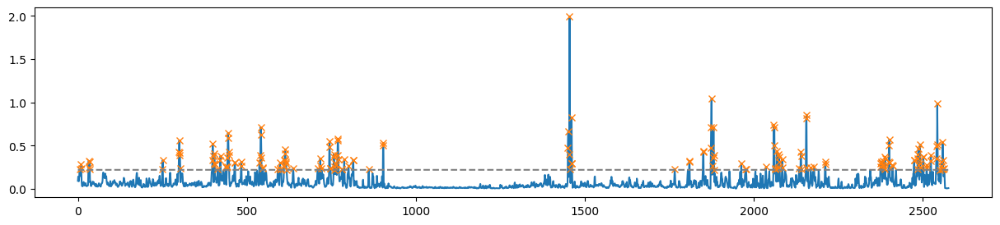

In [40]:
# Find aggressive turnings in acc_x
#peaks_accx, _ = find_peaks(df_sum_spectrum['acc_x'], height=0.22)
peaks_accx = df_sum_spectrum[df_sum_spectrum['acc_x'] > 0.22].index

plt.figure(figsize=(15,3))
plt.plot(df_sum_spectrum['acc_x'])
plt.plot(peaks_accx, df_sum_spectrum['acc_x'][peaks_accx], "x")
plt.plot(np.zeros_like(df_sum_spectrum['acc_x'])+0.22, "--", color="gray")
plt.show()

In [41]:
fig = px.scatter_mapbox(lat=df_sum_spectrum['lat'][peaks_accx], lon=df_sum_spectrum['lon'][peaks_accx], zoom=10, width=500, height=500 , color_continuous_scale=px.colors.diverging.RdYlGn_r)
#fig.update_geos(scope='europe')
fig.update_geos(fitbounds="locations")
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    mapbox=dict(
    style="light", 
    accesstoken='pk.eyJ1Ijoicm9sYW5kbmFneSIsImEiOiJjbHRrZXptcWMweTJtMmlzNG40YjNmY3ozIn0.66tCRA-MiLLA-xAKcPiPlw',
    pitch=0,
    zoom=5
    )
)

fig.show()

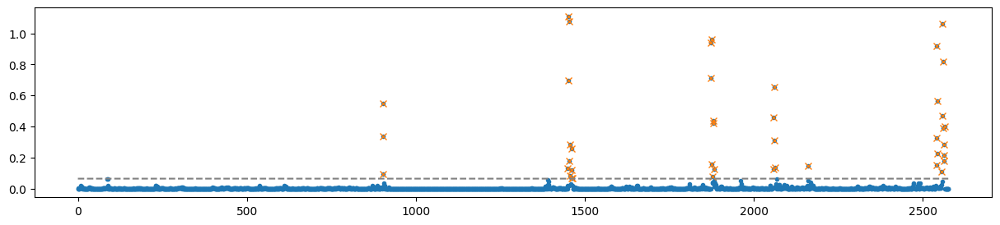

In [42]:
# Find aggressive turnings in gyr_z

#peaks_gyrz, _ = find_peaks(df_sum_spectrum['gyr_z'], height = np.std(df_sum_spectrum['gyr_z']), distance=1)
peaks_gyrz = df_sum_spectrum[df_sum_spectrum['gyr_z'] > np.std(df_sum_spectrum['gyr_z'])].index

plt.figure(figsize=(15,3))
plt.plot(df_sum_spectrum['gyr_z'],'.')
plt.plot(peaks_gyrz, df_sum_spectrum['gyr_z'][peaks_gyrz], "x")
plt.plot(np.zeros_like(df_sum_spectrum['gyr_z']) + np.std(df_sum_spectrum['gyr_z']), "--", color="gray")
plt.show()

In [191]:
fig = px.scatter_mapbox(lat=df_sum_spectrum['lat'][peaks_gyrz], lon=df_sum_spectrum['lon'][peaks_gyrz], zoom=10, width=500, height=500 , color_continuous_scale=px.colors.diverging.RdYlGn_r)
#fig.update_geos(scope='europe')
fig.update_geos(fitbounds="locations")
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    mapbox=dict(
    style="light", 
    accesstoken='pk.eyJ1Ijoicm9sYW5kbmFneSIsImEiOiJjbHRrZXptcWMweTJtMmlzNG40YjNmY3ozIn0.66tCRA-MiLLA-xAKcPiPlw',
    pitch=0,
    zoom=5
    )
)

fig.show()

In [43]:
peaks = pd.concat([pd.DataFrame(peaks_accx), pd.DataFrame(peaks_gyrz)], join="outer", ignore_index=True).drop_duplicates()[0]
peaks # Location indexes of aggressive turnings

0         5
1         9
2        10
3        32
4        33
       ... 
203    2160
206    2542
214    2562
215    2563
217    2565
Name: 0, Length: 187, dtype: int64

In [193]:
fig = px.scatter_mapbox(lat=df_sum_spectrum['lat'][peaks], lon=df_sum_spectrum['lon'][peaks], zoom=10, width=500, height=500 , color_continuous_scale=px.colors.diverging.RdYlGn_r)
#fig.update_geos(scope='europe')
fig.update_geos(fitbounds="locations")
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    mapbox=dict(
    style="light", 
    accesstoken='pk.eyJ1Ijoicm9sYW5kbmFneSIsImEiOiJjbHRrZXptcWMweTJtMmlzNG40YjNmY3ozIn0.66tCRA-MiLLA-xAKcPiPlw',
    pitch=0,
    zoom=5
    )
)

fig.show()

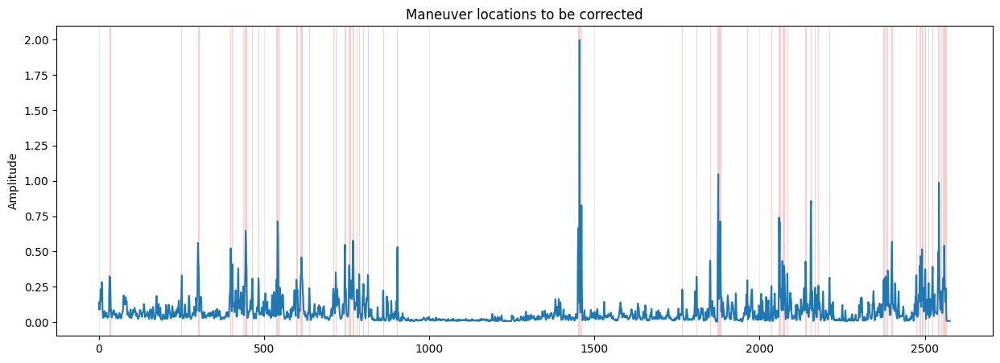

In [44]:
ax = df_sum_spectrum['acc_x'].plot(figsize=(15, 5), use_index=False, ylabel='Amplitude')
ax.grid(axis='x', alpha=0.3)
plt.title('Maneuver locations to be corrected')

# Highlight aggressive turning maneuvers
for peak in zip(peaks):
    ax.axvspan(peak[0], peak[0]+1, facecolor='red', alpha=.2)

#### Correction

In [45]:
df_sum_spectrum_corrected = df_sum_spectrum.copy()

In [46]:
df_sum_spectrum_corrected['acc_x'][peaks] = df_sum_spectrum['acc_x'].median()

/var/folders/w_/802pn39d4f75d8__y1zs9yxm0000gn/T/ipykernel_67431/746328853.py:1: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy




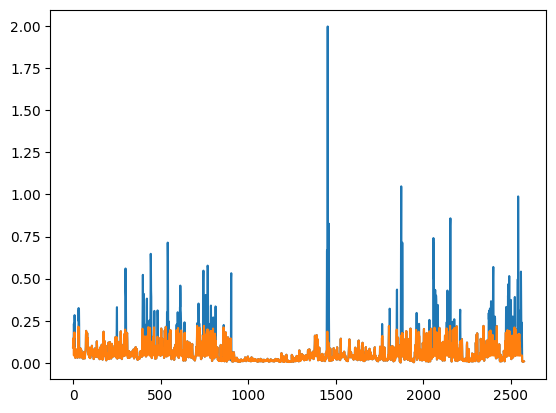

In [47]:
plt.plot(df_sum_spectrum['acc_x'])
plt.plot(df_sum_spectrum_corrected['acc_x'])

In [48]:
df_sum_spectrum_corrected['gyr_z'].loc[peaks] = df_sum_spectrum['gyr_z'].median()

/var/folders/w_/802pn39d4f75d8__y1zs9yxm0000gn/T/ipykernel_67431/475576752.py:1: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy




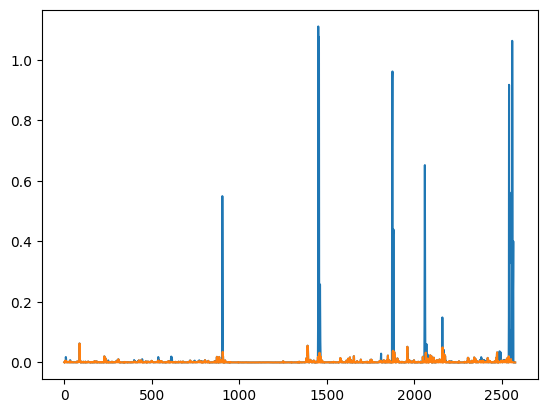

In [49]:
plt.plot(df_sum_spectrum['gyr_z'])
plt.plot(df_sum_spectrum_corrected['gyr_z'])

# New section

In [71]:
df_sum_spectrum_corrected.columns

Index(['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z', 'lat', 'lon'], dtype='object')

<Axes: ylabel='Frequency'>

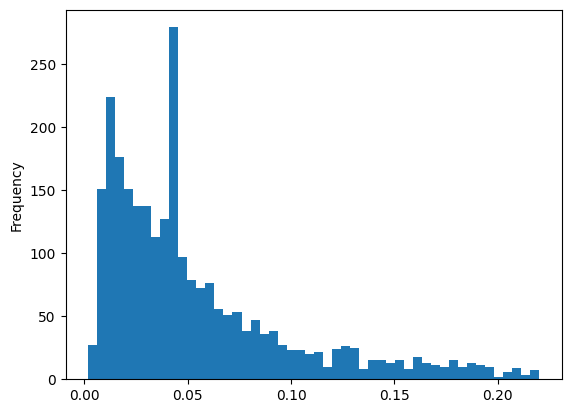

In [50]:
# skewed data, lognormal distribution

df_sum_spectrum_corrected['acc_x'].plot(kind='hist', bins=50)

- with PowerTransformer

In [51]:
from sklearn.preprocessing import MinMaxScaler

In [73]:
scaler = MinMaxScaler(feature_range=(0.0000000001,1))
df_scaled = scaler.fit_transform(df_sum_spectrum_corrected[['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z']])

In [74]:
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer(method='box-cox', standardize=False)
df_rescaled = pt.fit_transform(df_scaled)
# https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.PowerTransformer.html#sklearn.preprocessing.PowerTransformer
# https://scikit-learn.org/stable/modules/preprocessing.html

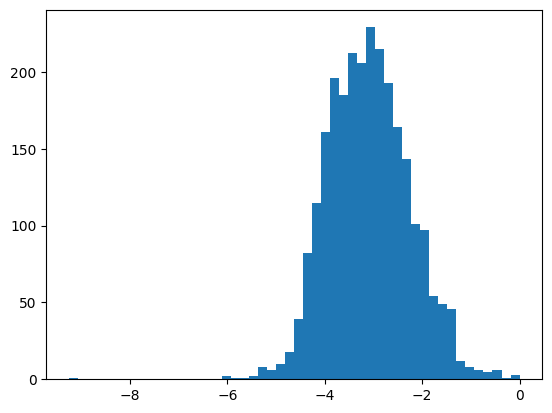

In [75]:
plt.hist(df_rescaled[:,3], bins=50);  #acc_z axis

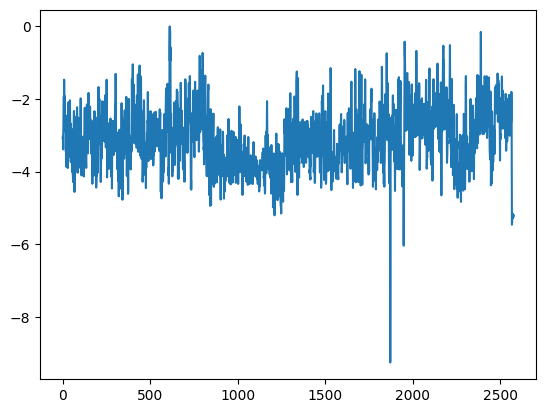

In [76]:
plt.plot(df_rescaled[:,3])

- with standard deviation based outlier removal

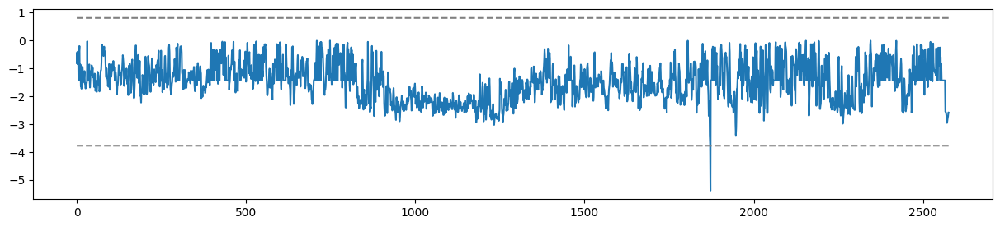

In [77]:
plt.figure(figsize=(15,3))
plt.plot(df_rescaled[:,0])
plt.plot((np.zeros_like(df_rescaled[:,0])+df_rescaled[:,0].mean()) + df_rescaled[:,0].std()*3.5, "--", color="gray")
plt.plot((np.zeros_like(df_rescaled[:,0])+df_rescaled[:,0].mean()) - df_rescaled[:,0].std()*3.5, "--", color="gray")
plt.show()

In [78]:
pd.DataFrame(df_rescaled)

,0,1,2,3,4,5
0,-0.808215,-2.889630,-2.962062,-3.074866,-1.833481,-3.943853
1,-0.421574,-2.919744,-2.448752,-3.013280,-2.080526,-3.226437
2,-0.822473,-2.866442,-2.285423,-3.388568,-2.178895,-3.524656
3,-0.852434,-2.845809,-2.217998,-2.860346,-1.966153,-3.948496
4,-0.381813,-2.573143,-1.990025,-2.558108,-1.782508,-3.706712
...,...,...,...,...,...,...
2572,-2.859729,-5.080092,-3.325959,-5.243603,-4.756296,-7.501328
2573,-2.778249,-5.095397,-3.237691,-5.172530,-4.636259,-15.389790
2574,-2.710008,-5.130247,-3.233699,-5.207230,-4.630913,-8.315934
2575,-2.576098,-5.165266,-3.207332,-5.232288,-4.506049,-6.712545


In [79]:
df_outliers_removed = pd.DataFrame(df_rescaled).copy()
for vars in df_outliers_removed:
    df_outliers_removed[vars][df_outliers_removed[vars] > (df_outliers_removed[vars].mean() + df_outliers_removed[vars].std()*3.5)] = (df_outliers_removed[vars].mean() + df_outliers_removed[vars].std()*3.5)
    df_outliers_removed[vars][df_outliers_removed[vars] < (df_outliers_removed[vars].mean() - df_outliers_removed[vars].std()*3.5)] = (df_outliers_removed[vars].mean() - df_outliers_removed[vars].std()*3.5)

/var/folders/w_/802pn39d4f75d8__y1zs9yxm0000gn/T/ipykernel_67431/3484797227.py:3: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


/var/folders/w_/802pn39d4f75d8__y1zs9yxm0000gn/T/ipykernel_67431/3484797227.py:4: FutureWarning:

ChainedAssignme

In [88]:
df_outliers_removed.describe()

,0,1,2,3,4,5
count,2577.000000,2577.000000,2577.000000,2577.000000,2577.000000,2577.000000
mean,-1.479134,-3.068788,-3.067007,-3.087306,-2.952339,-4.096648
std,0.652217,0.730719,0.799272,0.833095,0.753822,1.039827
min,-3.772866,-5.671769,-5.894910,-6.028372,-5.622657,-7.815250
25%,-1.952613,-3.599589,-3.650901,-3.702272,-3.471105,-4.779346
50%,-1.428735,-3.144318,-3.111991,-3.106434,-3.036875,-4.142829
75%,-1.049843,-2.637402,-2.529495,-2.546767,-2.464399,-3.528822
max,0.000000,-0.462231,-0.239845,-0.147814,-0.282869,-0.377003


In [66]:
fig = px.scatter_mapbox(lat=df_sum_spectrum['lat'], lon=df_sum_spectrum['lon'], color = df_outliers_removed[3], zoom=10, width=500, height=500 , color_continuous_scale=px.colors.diverging.RdYlGn_r)
#fig.update_geos(scope='europe')
fig.update_geos(fitbounds="locations")
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    mapbox=dict(
    style="light", 
    accesstoken='pk.eyJ1Ijoicm9sYW5kbmFneSIsImEiOiJjbHRrZXptcWMweTJtMmlzNG40YjNmY3ozIn0.66tCRA-MiLLA-xAKcPiPlw',
    pitch=0,
    zoom=5
    )
)

fig.show()

# Segmentation

In [67]:
import ruptures as rpt

In [99]:
# detection with https://centre-borelli.github.io/ruptures-docs/code-reference/detection/pelt-reference/ 

#algo = rpt.Dynp(model="l2").fit(df_outliers_removed[0].to_numpy())
#result = algo.predict(n_bkps=40)

algo = rpt.Pelt().fit(df_outliers_removed[2].to_numpy())
result = algo.predict(1)
result[:5]

[10, 20, 30, 35, 75]

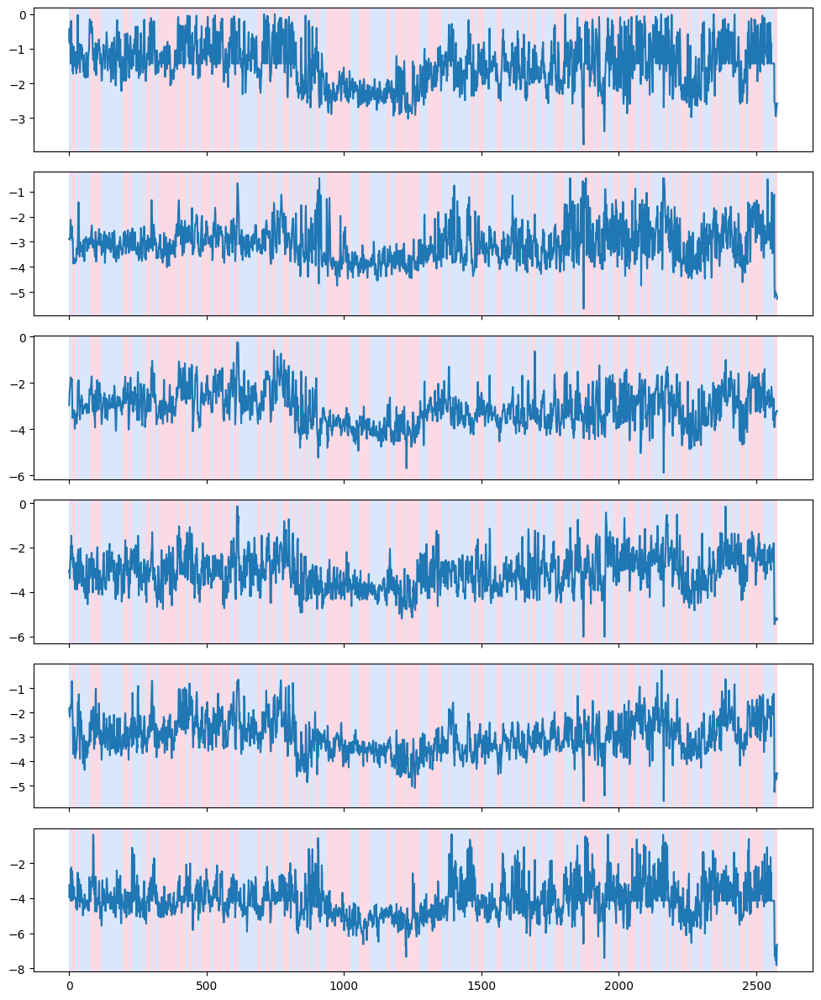

In [100]:
# display segmentation
rpt.display(df_outliers_removed.to_numpy(), result)
plt.show()

In [104]:
from scipy import stats

def calculate_mean_vector(df, breakpoints): #mean
    vector = np.zeros(len(df))
    for i in range(len(breakpoints) - 1):
        start = breakpoints[i]
        end = breakpoints[i + 1]
        segment = df.iloc[start:end]
        value = segment.mean()
        vector[start:end] = value
    return vector

def calculate_var_vector(df, breakpoints): #variance
    vector = np.zeros(len(df))
    for i in range(len(breakpoints) - 1):
        start = breakpoints[i]
        end = breakpoints[i + 1]
        segment = df.iloc[start:end]
        value = segment.var()
        vector[start:end] = value
    return vector

def calculate_std_vector(df, breakpoints): #std
    vector = np.zeros(len(df))
    for i in range(len(breakpoints) - 1):
        start = breakpoints[i]
        end = breakpoints[i + 1]
        segment = df.iloc[start:end]
        value = segment.std()
        vector[start:end] = value
    return vector

def calculate_median_vector(df, breakpoints): #median
    vector = np.zeros(len(df))
    for i in range(len(breakpoints) - 1):
        start = breakpoints[i]
        end = breakpoints[i + 1]
        segment = df.iloc[start:end]
        value = segment.median()
        vector[start:end] = value
    return vector

#rms
#rms = np.sqrt(np.mean(y**2))
def calculate_rms_vector(df, breakpoints): #median
    vector = np.zeros(len(df))
    for i in range(len(breakpoints) - 1):
        start = breakpoints[i]
        end = breakpoints[i + 1]
        segment = df.iloc[start:end]
        value = np.sqrt(np.mean(segment**2))
        vector[start:end] = value
    return vector


def calculate_entropy_vector(df, breakpoints): #entropy
    vector = np.zeros(len(df))
    for i in range(len(breakpoints) - 1):
        start = breakpoints[i]
        end = breakpoints[i + 1]
        segment = df.iloc[start:end]
        value = stats.entropy(segment)
        vector[start:end] = value
    return vector

def calculate_kurtosis_vector(df, breakpoints): #kurtosis
    vector = np.zeros(len(df))
    for i in range(len(breakpoints) - 1):
        start = breakpoints[i]
        end = breakpoints[i + 1]
        segment = df.iloc[start:end]
        value = stats.kurtosis(segment)
        vector[start:end] = value
    return vector


def calculate_len_vector(df, breakpoints): #length
    vector = np.zeros(len(df))
    for i in range(len(breakpoints) - 1):
        start = breakpoints[i]
        end = breakpoints[i + 1]
        segment = df.iloc[start:end]
        value = len(segment)
        vector[start:end] = value
    return vector

def calculate_spikiness_vector(df, breakpoints): #spikiness
    vector = np.zeros(len(df))
    for i in range(len(breakpoints) - 1):
        start = breakpoints[i]
        end = breakpoints[i + 1]
        segment = df.iloc[start:end]
        value = np.var(np.diff(segment))
        vector[start:end] = value
    return vector

import statsmodels.api as sm

def calculate_stability_vector(df, breakpoints): #spikiness
    vector = np.zeros(len(df))
    for i in range(len(breakpoints) - 1):
        start = breakpoints[i]
        end = breakpoints[i + 1]
        segment = df.iloc[start:end]
        value = np.median(sm.tsa.acf(segment, nlags=10))
        vector[start:end] = value
    return vector

In [105]:
# Generate new values for feature space

df_features = df_outliers_removed.copy()
df_features['mean'] = calculate_mean_vector(df_outliers_removed[2], result)
df_features['std'] = calculate_std_vector(df_outliers_removed[2], result)
df_features['var'] = calculate_var_vector(df_outliers_removed[2], result)
df_features['median'] = calculate_median_vector(df_outliers_removed[2], result)
df_features['rms'] = calculate_rms_vector(df_outliers_removed[2], result)
df_features['kurtosis'] = calculate_kurtosis_vector(df_outliers_removed[2], result)
df_features['length'] = calculate_len_vector(df_outliers_removed[2], result)
df_features['spikiness'] = calculate_spikiness_vector(df_outliers_removed[2], result)
df_features['stability'] = calculate_stability_vector(df_outliers_removed[2], result)

<Axes: >

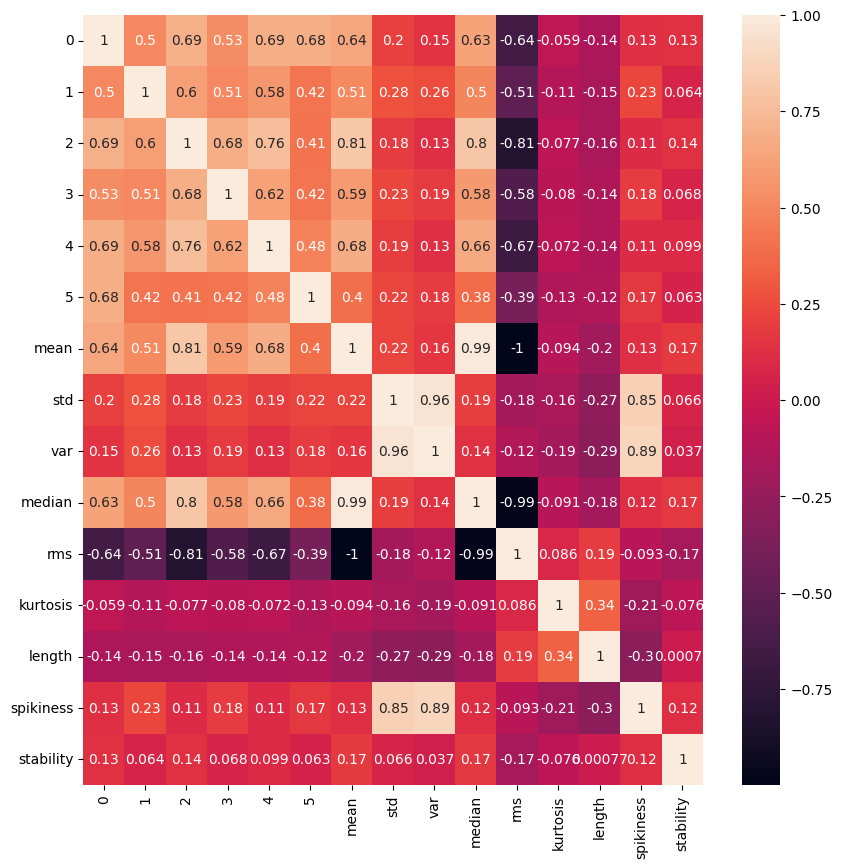

In [140]:
plt.figure(figsize=(10,10))
sns.heatmap(df_features.corr(), annot=True)

In [108]:
fig = px.scatter_mapbox(lat=df_sum_spectrum['lat'], lon=df_sum_spectrum['lon'], color = df_features['median'], zoom=10, width=500, height=500 , color_continuous_scale=px.colors.diverging.RdYlGn_r)
#fig.update_geos(scope='europe')
fig.update_geos(fitbounds="locations")
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    mapbox=dict(
    style="light", 
    accesstoken='pk.eyJ1Ijoicm9sYW5kbmFneSIsImEiOiJjbHRrZXptcWMweTJtMmlzNG40YjNmY3ozIn0.66tCRA-MiLLA-xAKcPiPlw',
    pitch=0,
    zoom=5
    )
)

fig.show()

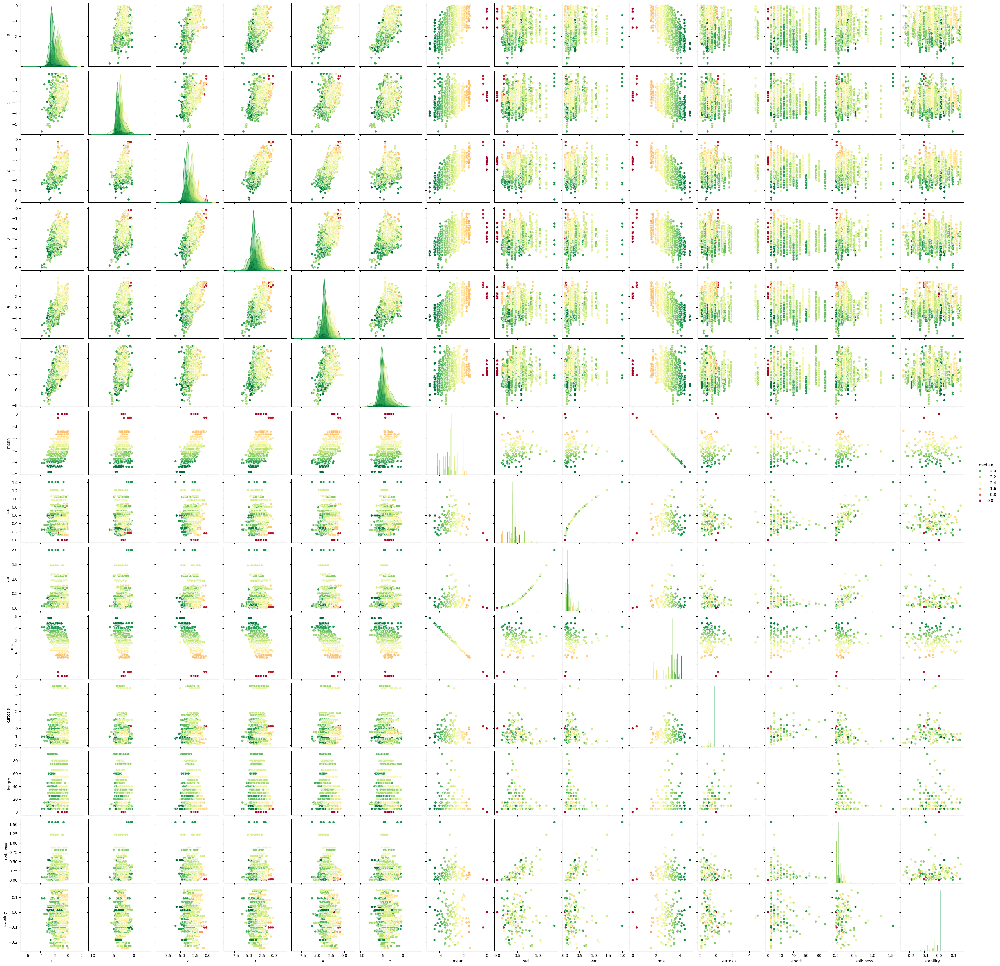

In [109]:
sns.pairplot(data = df_features, hue = 'median', palette='RdYlGn_r')

<Axes: xlabel='std', ylabel='mean'>

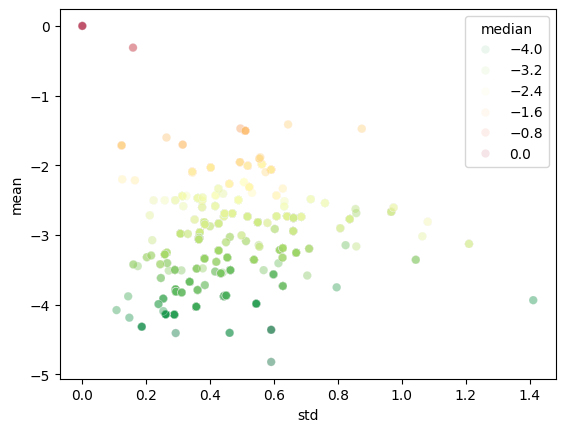

In [115]:
sns.scatterplot(data = df_features, x='std',y='mean', hue='median', alpha=0.1, palette='RdYlGn_r')
#sns.jointplot(x=df_features['mean'], y=df_features['std'], kind='kde')
#plt.colorbar()

#### Export the data (for safety saving)

In [596]:
to_export = pd.DataFrame([df_sum_spectrum['lat'], df_sum_spectrum['lon'], median_vector[0]]).T
to_export.columns = ['lat','lon', 'quality']
to_export

,lat,lon,quality
0,46.899810,16.857534,0.000000
1,46.899785,16.857527,0.000000
2,46.899758,16.857519,0.000000
3,46.899730,16.857511,0.000000
4,46.899703,16.857503,0.000000
...,...,...,...
2572,46.825883,16.829317,-4.320014
2573,46.825883,16.829317,-4.320014
2574,46.825883,16.829317,-4.320014
2575,46.825883,16.829317,-4.320014


In [597]:
to_export.to_csv('./../../Data_phone/processed_bf_unsup_fit.csv', index=False)

In [602]:
len(to_export['quality'].unique())

207

# Unsupervised Machine learning

In [122]:
df_features = df_features.iloc[10:]

In [127]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_samples, silhouette_score

#X = df_outliers_removed.copy()
#X = df_rescaled.copy()
#X = mean_vector.copy()
X = df_features[['std', 'mean']]
X.columns = [0,1]

For n_clusters = 2 The average silhouette_score is : 0.5193978107386643
For n_clusters = 3 The average silhouette_score is : 0.46672447659228794
For n_clusters = 4 The average silhouette_score is : 0.4778617217075001
For n_clusters = 5 The average silhouette_score is : 0.42227612200076753
For n_clusters = 6 The average silhouette_score is : 0.3961593528282969
For n_clusters = 7 The average silhouette_score is : 0.40477557032367323
For n_clusters = 8 The average silhouette_score is : 0.4259205842134407
For n_clusters = 9 The average silhouette_score is : 0.44840796617520273
For n_clusters = 10 The average silhouette_score is : 0.43878055138902694


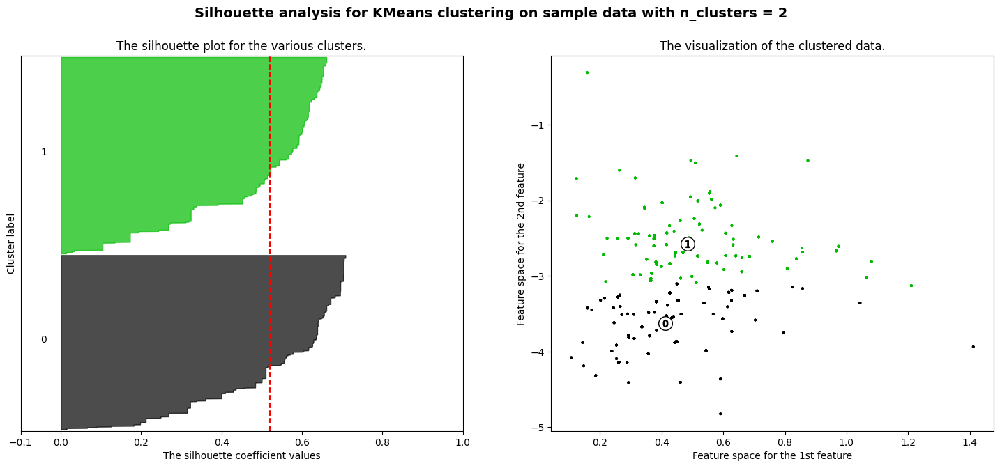

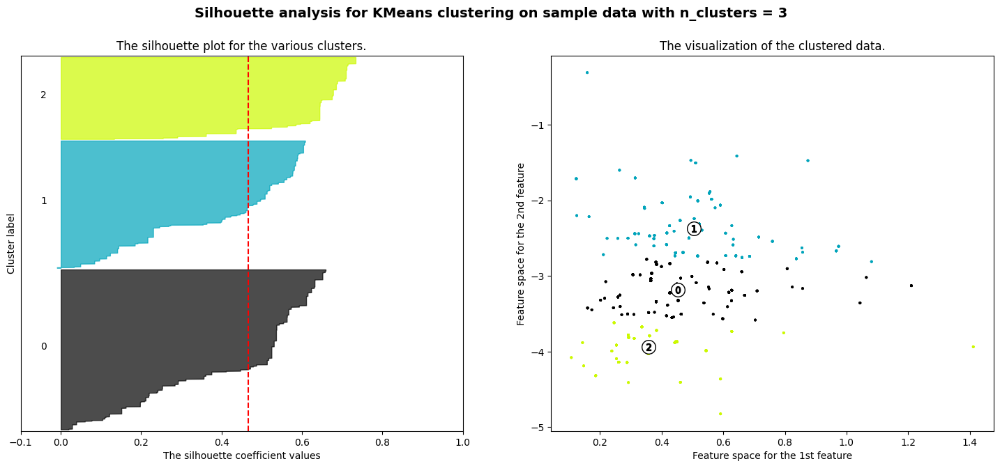

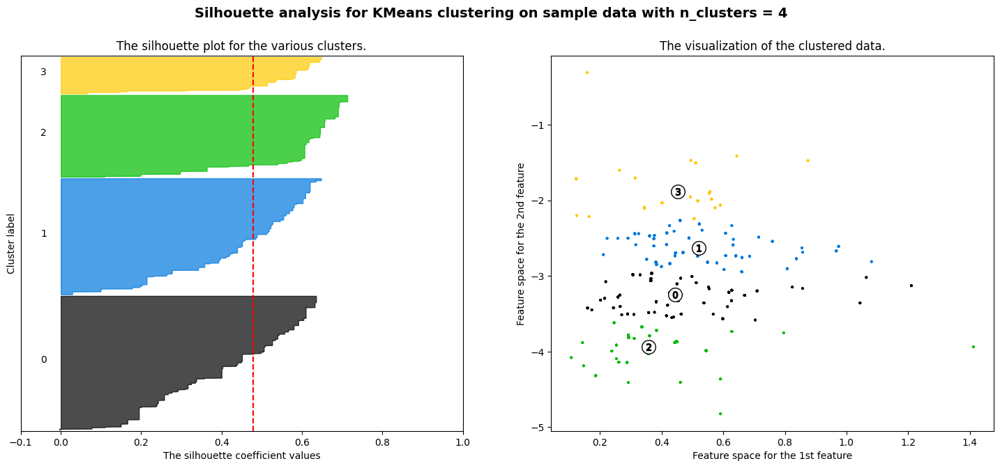

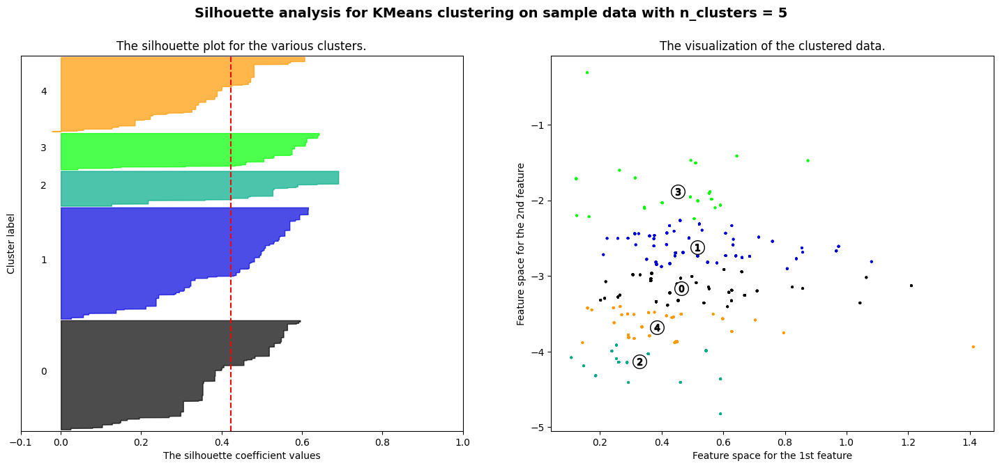

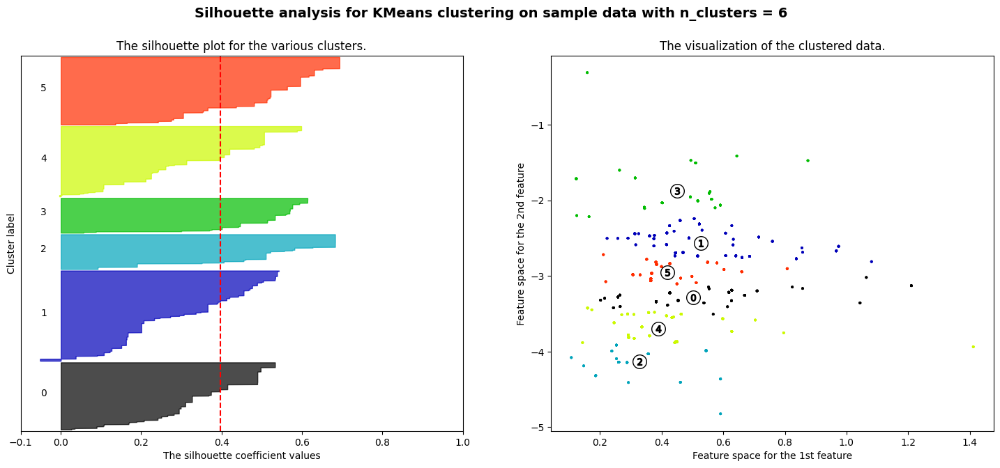

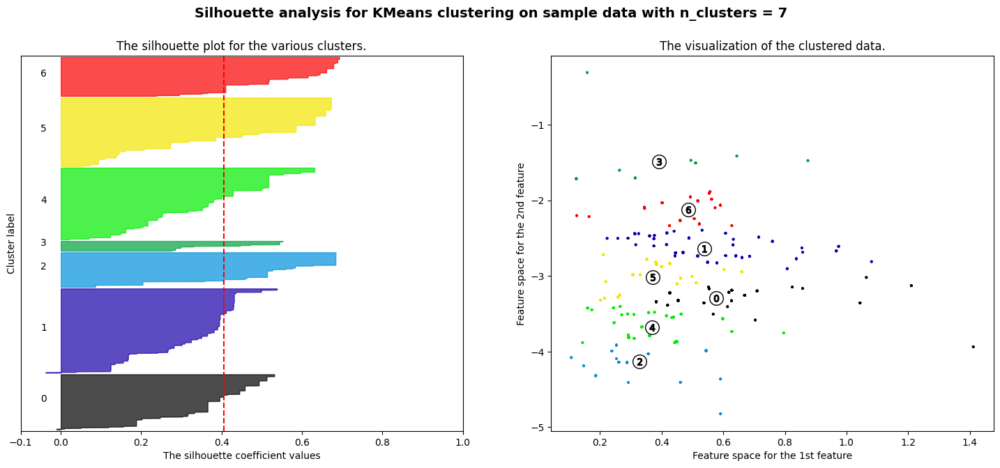

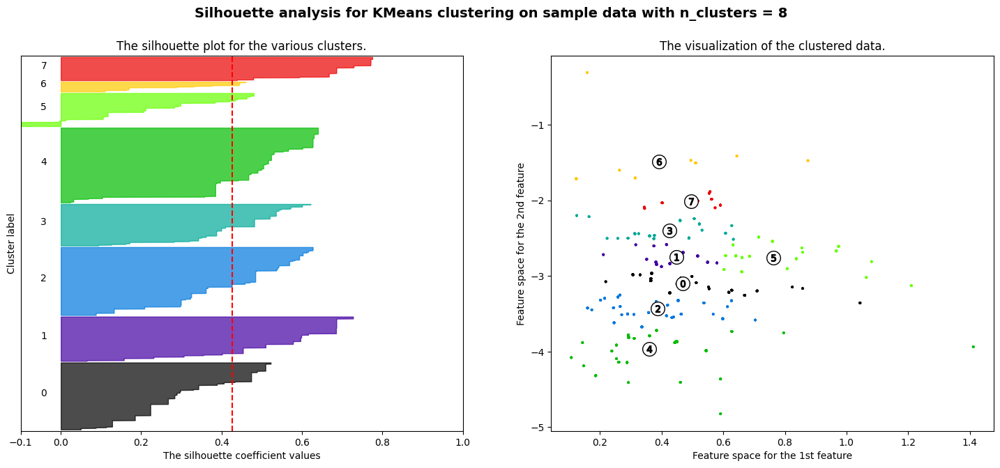

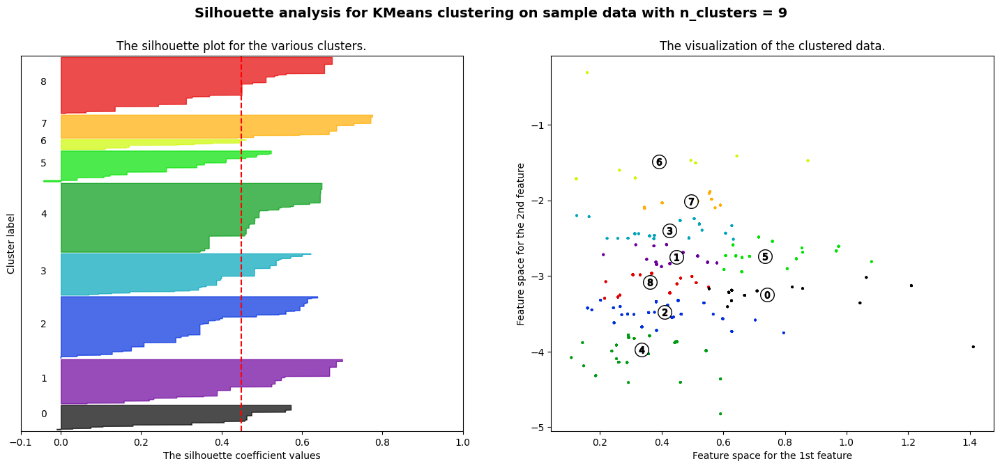

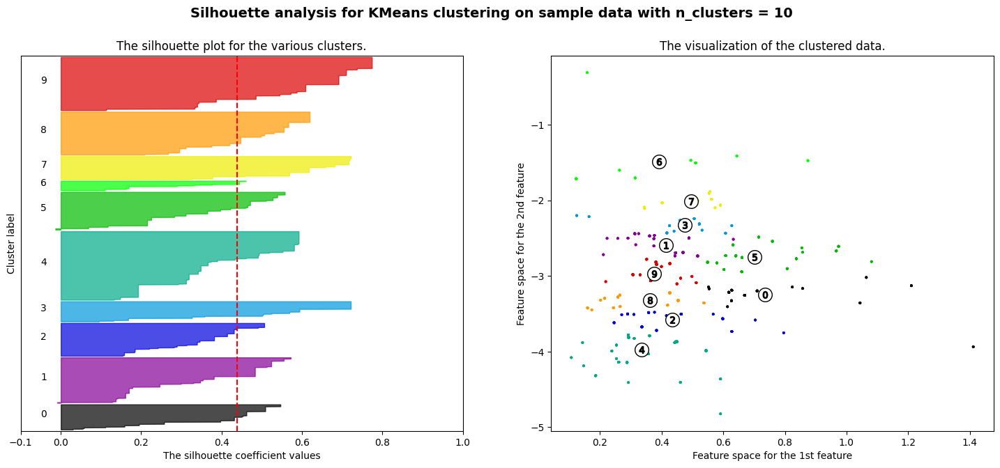

In [128]:
import matplotlib.cm as cm

range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[0], X[1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

# Runtime: 17 min

In [ ]:
# Optimal number of classes: 3 or 4

# Future tasks: Search feature extraction methods and try another unsupervised learner models

In [134]:
clusterer = KMeans(n_clusters=6, random_state=10)
cluster_labels = clusterer.fit_predict(X)

In [132]:
cluster_labels[cluster_labels == 2] = 5
cluster_labels[cluster_labels == 3] = 2
cluster_labels[cluster_labels == 5] = 3

cluster_labels[cluster_labels == 1] = 10
cluster_labels[cluster_labels == 0] = 1
cluster_labels[cluster_labels == 10] = 0

In [135]:
fig = px.scatter_mapbox(lat=df_sum_spectrum['lat'].iloc[10:], lon=df_sum_spectrum['lon'].iloc[10:], color = cluster_labels, zoom=10, width=500, height=500 , color_continuous_scale=px.colors.diverging.RdYlGn_r)
#fig.update_geos(scope='europe')
fig.update_geos(fitbounds="locations")
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    mapbox=dict(
    style="light", 
    accesstoken='pk.eyJ1Ijoicm9sYW5kbmFneSIsImEiOiJjbHRrZXptcWMweTJtMmlzNG40YjNmY3ozIn0.66tCRA-MiLLA-xAKcPiPlw',
    pitch=0,
    zoom=5
    )
)

fig.show()